# Multimodal RAG

***Run the [`0_data_prep.ipynb`](./0_data_prep.ipynb) notebook prior to running this notebook.***

1. We download a subset of data from the [Amazon Berkley Objects](https://amazon-berkeley-objects.s3.amazonaws.com/index.html) dataset. The data includes Amazon products with metadata and catalog images. The metadata includes multiple tags that provide short text description of the product in the image. The data is filtered to only keep images that are associated for tags with description in a given language (`enUS` in our example), to limit the size of the data.

1. We convert all downloaded images into Base64 encoding.

1. An image and its associated text are converted into embeddings in a single `invoke_model` call to the `amazon.titan-embed-image-v1` model. We embed all images in our dataset in this way.

1. These embeddings are then ingested into in-memory [FAISS](https://github.com/facebookresearch/faiss) database to store and search for embeddings vectors. In a real-world scenario, you will likely want to use a persistent data store such as the [vector engine for Amazon OpenSearch Service Serverless](https://aws.amazon.com/opensearch-service/serverless-vector-engine/) or the pgvector extension for PostgreSQL.

1. Now for retrieval, we consider the following scenario: a customer is looking for a product and has a text description of the product and, optionally, an image of the product, we do an embeddings based similarity search by converting the text description and the image into embeddings using the `Amazon Titan Embeddings G1 - Image` model and retrieve the most relevant results from the vector database. 

1. We then further refine these search results by creating a text prompt using the description for the retrieved objects and asking the LLM (`Anthropic Claude v2`) to do the following:
    * Reason through the responses based on the customer's description of what they were looking for and then either accept or reject each of the search results
    * Explain the reasoning why each result was accepted or rejected. 
    * The text response generated by the model along with the accepted set of results (images and text) are returned to the customer.

In [1]:
import sys
!{sys.executable} -m pip install -r requirements.txt


In [2]:
import os
import io
import sys
import json
import glob
import faiss
import boto3
import base64
import logging
import requests
import numpy as np
import pandas as pd
from PIL import Image
from globals import *
from typing import List
from botocore.auth import SigV4Auth
from faiss import write_index, read_index
from langchain.llms.bedrock import Bedrock
from botocore.awsrequest import AWSRequest
from faiss.swigfaiss_avx2 import IndexFlatIP

logging.basicConfig(format='[%(asctime)s] p%(process)s {%(filename)s:%(lineno)d} %(levelname)s - %(message)s', level=logging.INFO)
logger = logging.getLogger(__name__)


/home/ec2-user/anaconda3/envs/python3/lib/python3.10/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.0' or newer of 'numexpr' (version '2.7.3' currently installed).
  from pandas.core.computation.check import NUMEXPR_INSTALLED


In [3]:
# global constants
!pygmentize globals.py


import os

# global constants
LISTINGS_FILE: str = os.path.join("listings", "metadata", "listings_0.json")
LANGUAGE_TO_FILTER: str = "en_US"
IMAGE_ID_TO_FNAME_MAPPING_FILE: str = "images.csv"
ABO_S3_BUCKET: str = "amazon-berkeley-objects"
ABO_S3_PREFIX:str = "images/original"
ABO_S3_BUCKET_PREFIX: str = f"s3://{ABO_S3_BUCKET}/{ABO_S3_PREFIX}"
IMAGE_DATASET_FNAME: str = f"aob_{LANGUAGE_TO_FILTER}.csv"
DATA_DIR: str = "data"
IMAGES_DIR: str = os.path.join(DATA_DIR, "images", LANGUAGE_TO_FILTER)
B64_ENCODED_IMAGES_DIR: str = os.path.join(DATA_DIR, "b64_images", LANGUAGE_TO_FILTER)
VECTOR_DB_DIR: str = os.path.join(DATA_DIR, "vectordb", LANGUAGE_TO_FILTER)
SUCCESSFULLY_EMBEDDED_DIR: str = os.path.join(DATA_DIR, "successfully_embedded", LANGUAGE_TO_FILTER)
IMAGE_DATA_W_SUCCESSFUL_EMBEDDINGS_FPATH: str = os.path.join(SUCCESSFULLY_EMBEDDED_DIR, "data.csv")
os.makedirs(DATA_DIR, exist_ok=True)
os.makedirs(IMAGES_DIR, exist_ok=True)
os.makedirs(B64_ENCODED_IMAGES_DIR, exist_ok=True)
os.makedirs

In [4]:
def display_image(fpath: str) -> None:
    image = Image.open(fpath)
    return image

# convert all the downloaded files into base64 encoding
def encode_image_to_base64(image_file_path: str):
    with open(image_file_path, "rb") as image_file:
        b64_image = base64.b64encode(image_file.read()).decode('utf8')
    return b64_image


In [5]:
bedrock = boto3.client(
    service_name="bedrock-runtime", region_name="us-east-1", endpoint_url=FMC_URL
)


[2023-11-24 23:32:10,057] p3112 {credentials.py:1055} INFO - Found credentials from IAM Role: BaseNotebookInstanceEc2InstanceRole


In [7]:
image_b64_file_list = glob.glob(os.path.join(B64_ENCODED_IMAGES_DIR, "*.b64"))
logger.info(f"there are {len(image_b64_file_list)} base64 encoded images in {B64_ENCODED_IMAGES_DIR}")
image_b64_file_list[:10]


[2023-11-24 23:32:11,656] p3112 {1427266106.py:2} INFO - there are 1489 base64 encoded images in data/b64_images/en_US


['data/b64_images/en_US/5cc7917f.jpg.b64',
 'data/b64_images/en_US/185bf389.jpg.b64',
 'data/b64_images/en_US/0a538be1.jpg.b64',
 'data/b64_images/en_US/2c095d5d.jpg.b64',
 'data/b64_images/en_US/2b44e9d3.jpg.b64',
 'data/b64_images/en_US/38ff0816.jpg.b64',
 'data/b64_images/en_US/d84164b8.jpg.b64',
 'data/b64_images/en_US/7a13639a.jpg.b64',
 'data/b64_images/en_US/62369538.jpg.b64',
 'data/b64_images/en_US/ba7b21ac.jpg.b64']

In [8]:
image_dataset = pd.read_csv(IMAGE_DATASET_FNAME)
logger.info(f"there are {len(image_dataset)} base64 encoded images in {IMAGE_DATASET_FNAME} dataset")

# only keep the rows for which we have image files downloaded already
image_dataset['path_b64'] = image_dataset.path.map(lambda x: os.path.join(B64_ENCODED_IMAGES_DIR, f"{os.path.basename(x)}.b64"))
logger.info(image_dataset.head())

image_b64_list_dataframe = pd.DataFrame(image_b64_file_list)
image_b64_list_dataframe.columns = ["path_b64"]
image_dataset = pd.merge(left=image_dataset, right=image_b64_list_dataframe, how="inner", on="path_b64")
image_dataset


[2023-11-24 23:32:12,129] p3112 {1470199822.py:2} INFO - there are 1543 base64 encoded images in aob_en_US.csv dataset
[2023-11-24 23:32:12,137] p3112 {1470199822.py:6} INFO -       image_id                                        description  height  \
0  61izEZdhlaL  Lead-free glass: made of crystal-clear, lead-f...    1197   
1  91IjyKZ76qL                                                NaN    2560   
2  71x4c-BafpL  Tripod speaker stand for easy speaker setup; i...    2560   
3  71-eMu0gN+L  Bright metallic tassels gleam against an earth...     704   
4  610jXVKNJpL  Lead-free glass: made of crystal-clear, lead-f...    1630   

   width             path                                path_b64  
0    894  07/075e5d67.jpg  data/b64_images/en_US/075e5d67.jpg.b64  
1   2560  c6/c6889ed4.jpg  data/b64_images/en_US/c6889ed4.jpg.b64  
2   2560  2b/2b90e918.jpg  data/b64_images/en_US/2b90e918.jpg.b64  
3   1770  2c/2c0416de.jpg  data/b64_images/en_US/2c0416de.jpg.b64  
4    863  ea/ea0c6da6

,image_id,description,height,width,path,path_b64
0,61izEZdhlaL,"Lead-free glass: made of crystal-clear, lead-f...",1197,894,07/075e5d67.jpg,data/b64_images/en_US/075e5d67.jpg.b64
1,91IjyKZ76qL,NaN,2560,2560,c6/c6889ed4.jpg,data/b64_images/en_US/c6889ed4.jpg.b64
2,71x4c-BafpL,Tripod speaker stand for easy speaker setup; i...,2560,2560,2b/2b90e918.jpg,data/b64_images/en_US/2b90e918.jpg.b64
3,71-eMu0gN+L,Bright metallic tassels gleam against an earth...,704,1770,2c/2c0416de.jpg,data/b64_images/en_US/2c0416de.jpg.b64
4,610jXVKNJpL,"Lead-free glass: made of crystal-clear, lead-f...",1630,863,ea/ea0c6da6.jpg,data/b64_images/en_US/ea0c6da6.jpg.b64
...,...,...,...,...,...,...
1538,71e51Rb1h4L,This top-grain leather sofa can bring natural ...,2560,2560,c4/c4c46850.jpg,data/b64_images/en_US/c4c46850.jpg.b64
1539,91qFxcWDtjL,NaN,1982,2560,01/0111c309.jpg,data/b64_images/en_US/0111c309.jpg.b64
1540,91NCaDVKPEL,White foam swirls amid blue ocean waves lappin...,1719,2560,85/85d5420a.jpg,data/b64_images/en_US/85d5420a.jpg.b64
1541,91XM523rZgL,Square-seat patio cushion (set of 2) with deco...,2560,2560,45/45e8e821.jpg,data/b64_images/en_US/45e8e821.jpg.b64


In [9]:
from pandas.core.series import Series
import numpy as np
import numpy
from typing import Dict
def get_embeddings(text: str, image: str) -> numpy.ndarray:
   
    # You can specify either text or image or both
    body = json.dumps(
        {
            "inputText": text,
            "inputImage": image
        }
    )
        
    modelId = FMC_MODEL_ID
    accept = ACCEPT_ENCODING
    contentType = CONTENT_ENCODING

    try:
        response = bedrock.invoke_model(
            body=body, modelId=modelId, accept=accept, contentType=contentType
        )
        response_body = json.loads(response.get("body").read())        
        embeddings = np.array([response_body.get("embedding")]).astype(np.float32)        
    except Exception as e:
        logger.error(f"exception while encoding text={text}, image(truncated)={image[:10]}, exception={e}")
        embeddings = None
    return embeddings

    


In [ ]:
%%time

import faiss
import numpy as np

index = None
image_dataset_successful_embeddings_only = []
for _, row in image_dataset.iterrows():
    logger.info(f"encoding image={row['path_b64']}, description={row['description']}")
    path_b64 = row['path_b64']
    # MAX image size supported is 2048 * 2048 pixels
    with open(path_b64, "rb") as image_file:
        input_image_b64 = image_file.read().decode('utf-8')        
    input_text = "No description" if row['description'] is np.nan else row['description']

    embeddings = get_embeddings(input_text, input_image_b64)
    if embeddings is None:
        logger.error(f"error creating embeddings for {row}")
        continue
    image_dataset_successful_embeddings_only.append(row)
    if index is None:
        vector_dimension = embeddings.shape[1]
        index = faiss.IndexFlatIP(vector_dimension)
    
    faiss.normalize_L2(embeddings)
    index.add(embeddings)


[2023-11-24 23:32:13,496] p3112 {<timed exec>:7} INFO - encoding image=data/b64_images/en_US/075e5d67.jpg.b64, description=Lead-free glass: made of crystal-clear, lead-free glass for stunning clarity; keeps its shine through many washings; beautifully showcases beverages and adds a touch of glamour to any gathering. Versatile: suitable for special occasions and everyday use; ideal for serving liquor, mixed drinks, and non-alcoholic beverages, like freshly squeezed lemonade, iced tea, juice, water, soda, and more. Chic style and easy care: heavy sham for extra stability; squared base transitions into a circular rim for eye-catching aesthetics; dishwasher-safe for convenient cleaning. Includes: (8) 16-ounce cooler glasses and (8) 13-ounce DOF glasses; made in the USA. Dimensions: cooler glass measures 6.2 inches high by 3.1 inches wide with a 2.9-inch base; DOF glass measures 4 inches high by 3.6 inches wide with a 3.3-inch base
[2023-11-24 23:32:13,705] p3112 {<timed exec>:7} INFO - enc

In [11]:
logger.info(f"successfully ingested {len(image_dataset_successful_embeddings_only)} images and descriptions into the vector db index")
image_dataset_successful_embeddings_only_df = pd.DataFrame(image_dataset_successful_embeddings_only)
image_dataset_successful_embeddings_only_df.to_csv(IMAGE_DATA_W_SUCCESSFUL_EMBEDDINGS_FPATH, index=False)
image_dataset_successful_embeddings_only_df.head()


[2023-11-24 23:43:54,466] p3112 {2793824454.py:1} INFO - successfully ingested 1543 images and descriptions into the vector db index


,image_id,description,height,width,path,path_b64
0,61izEZdhlaL,"Lead-free glass: made of crystal-clear, lead-f...",1197,894,07/075e5d67.jpg,data/b64_images/en_US/075e5d67.jpg.b64
1,91IjyKZ76qL,NaN,2560,2560,c6/c6889ed4.jpg,data/b64_images/en_US/c6889ed4.jpg.b64
2,71x4c-BafpL,Tripod speaker stand for easy speaker setup; i...,2560,2560,2b/2b90e918.jpg,data/b64_images/en_US/2b90e918.jpg.b64
3,71-eMu0gN+L,Bright metallic tassels gleam against an earth...,704,1770,2c/2c0416de.jpg,data/b64_images/en_US/2c0416de.jpg.b64
4,610jXVKNJpL,"Lead-free glass: made of crystal-clear, lead-f...",1630,863,ea/ea0c6da6.jpg,data/b64_images/en_US/ea0c6da6.jpg.b64


In [12]:
logger.info(f"going to save vectordb index with {index.ntotal} to {VECTOR_DB_INDEX_FPATH}")
write_index(index, VECTOR_DB_INDEX_FPATH)


[2023-11-24 23:43:56,465] p3112 {1909775919.py:1} INFO - going to save vectordb index with 1543 to data/vectordb/en_US/aob_en_US_index


In [13]:
logger.info(f"going to load vectordb index with from {VECTOR_DB_INDEX_FPATH}")
index = read_index(VECTOR_DB_INDEX_FPATH)
logger.info(f"there are {index.ntotal} elements in index loaded from {VECTOR_DB_INDEX_FPATH}, index type={type(index)}")


[2023-11-24 23:43:57,117] p3112 {2647357682.py:1} INFO - going to load vectordb index with from data/vectordb/en_US/aob_en_US_index
[2023-11-24 23:43:57,124] p3112 {2647357682.py:3} INFO - there are 1543 elements in index loaded from data/vectordb/en_US/aob_en_US_index, index type=<class 'faiss.swigfaiss_avx2.IndexFlat'>


In [14]:
def find_multimodal_match(search_text: str, search_image: str, index: IndexFlatIP, k: int) -> List:
    logger.info(f"search_text={search_text}, search_image(truncated)={search_image[:100]}, index={index}, k={K}")
    search_vector = get_embeddings(search_text, search_image)
    faiss.normalize_L2(search_vector)
    
    distances, ann = index.search(search_vector, k=k)
    matches = {'distances': distances[0], 'ann': ann[0]}
    results = pd.DataFrame(matches).sort_values(by="distances", ascending=False)
    
    return results


In [15]:
def generate_image(prompt: str, negative_prompts: List):
    body = json.dumps({
        "text_prompts": ([{"text": prompt, "weight": 1.0}] + [{"text": negprompt, "weight": -1.0} for negprompt in negative_prompts]),
        "cfg_scale": 10,
        "seed": 20,
        "steps": 50,
        "style_preset": "photographic",
    })
    modelId = "stability.stable-diffusion-xl"
    accept = "application/json"
    contentType = "application/json"

    try:

        response = bedrock.invoke_model(
            body=body, modelId=modelId, accept=accept, contentType=contentType
        )
        response_body = json.loads(response.get("body").read())

        #print(response_body["result"])
        print(f'{response_body.get("artifacts")[0].get("base64")[0:80]}...')

    except botocore.exceptions.ClientError as error:

        if error.response['Error']['Code'] == 'AccessDeniedException':
            print(f"\x1b[41m{error.response['Error']['Message']}\
                    \nTo troubeshoot this issue please refer to the following resources.\
                    \nhttps://docs.aws.amazon.com/IAM/latest/UserGuide/troubleshoot_access-denied.html\
                    \nhttps://docs.aws.amazon.com/bedrock/latest/userguide/security-iam.html\x1b[0m\n")

        else:
            raise error
    base_64_img_str = response_body.get("artifacts")[0].get("base64")
    #image = Image.open(io.BytesIO(base64.decodebytes(bytes(base_64_img_str, "utf-8"))))
    return base_64_img_str


iVBORw0KGgoAAAANSUhEUgAAAgAAAAIACAIAAAB7GkOtAAAERGVYSWZNTQAqAAAACAAGAQAABAAAAAEA...


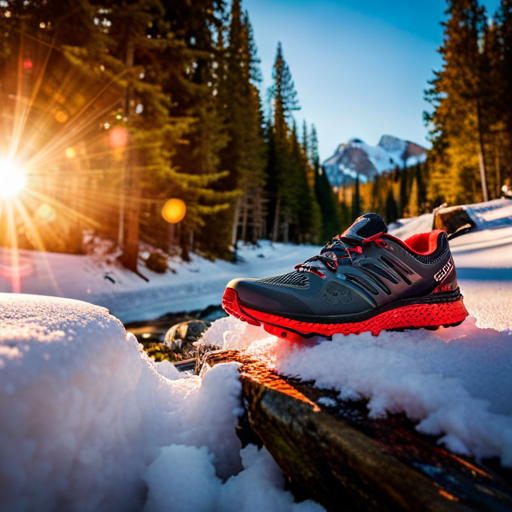

In [16]:
search_text:str = "black or gray colored running shoe for men, trail running, comfortable, wide toebox. Only show PUMA or Nike."
image_prompt:str = "A zoomed in product image of a black or gray colored trail running shoe for men, comfortable with wide toebox."
negative_prompts: List = ["in focus background", "in focus athlete", "front view"]
search_image = generate_image(image_prompt, negative_prompts)
image = Image.open(io.BytesIO(base64.decodebytes(bytes(search_image, "utf-8"))))
display(image)


In [17]:
image_dataset_successful_embeddings_only_df = pd.read_csv(IMAGE_DATA_W_SUCCESSFUL_EMBEDDINGS_FPATH)
image_dataset_successful_embeddings_only_df.head()


,image_id,description,height,width,path,path_b64
0,61izEZdhlaL,"Lead-free glass: made of crystal-clear, lead-f...",1197,894,07/075e5d67.jpg,data/b64_images/en_US/075e5d67.jpg.b64
1,91IjyKZ76qL,NaN,2560,2560,c6/c6889ed4.jpg,data/b64_images/en_US/c6889ed4.jpg.b64
2,71x4c-BafpL,Tripod speaker stand for easy speaker setup; i...,2560,2560,2b/2b90e918.jpg,data/b64_images/en_US/2b90e918.jpg.b64
3,71-eMu0gN+L,Bright metallic tassels gleam against an earth...,704,1770,2c/2c0416de.jpg,data/b64_images/en_US/2c0416de.jpg.b64
4,610jXVKNJpL,"Lead-free glass: made of crystal-clear, lead-f...",1630,863,ea/ea0c6da6.jpg,data/b64_images/en_US/ea0c6da6.jpg.b64


In [18]:
matches = find_multimodal_match(search_text, search_image, index, K)
display(matches)
matches_from_dataset = image_dataset_successful_embeddings_only_df.iloc[list(matches.ann), :]
matches_from_dataset


[2023-11-24 23:44:10,797] p3112 {55350513.py:2} INFO - search_text=black or gray colored running shoe for men, trail running, comfortable, wide toebox. Only show PUMA or Nike., search_image(truncated)=iVBORw0KGgoAAAANSUhEUgAAAgAAAAIACAIAAAB7GkOtAAAERGVYSWZNTQAqAAAACAAGAQAABAAAAAEAAAIAAQEABAAAAAEAAAIA, index=<faiss.swigfaiss_avx2.IndexFlat; proxy of <Swig Object of type 'faiss::IndexFlat *' at 0x7fcbb64b0840> >, k=4


,distances,ann
0,0.650614,798
1,0.617803,470
2,0.617793,1073
3,0.617793,1072


,image_id,description,height,width,path,path_b64
798,71sWBzYD+2L,"Marking Outsole. Boys sneaker lace- up shoe, e...",1343,2306,28/28493ca2.jpg,data/b64_images/en_US/28493ca2.jpg.b64
470,71MJpxheafL,Amazon partnered with PUMA to deliver a new co...,2560,1970,ee/ee5d99bc.jpg,data/b64_images/en_US/ee5d99bc.jpg.b64
1073,81zmIJ5z5BL,Amazon partnered with PUMA to deliver a new co...,2560,1970,7e/7e4fa60e.jpg,data/b64_images/en_US/7e4fa60e.jpg.b64
1072,81zmIJ5z5BL,Amazon partnered with PUMA to deliver a new co...,2560,1970,7e/7e4fa60e.jpg,data/b64_images/en_US/7e4fa60e.jpg.b64


[2023-11-24 23:44:11,538] p3112 {2686887611.py:1} INFO - search text = "black or gray colored running shoe for men, trail running, comfortable, wide toebox. Only show PUMA or Nike."
[2023-11-24 23:44:11,540] p3112 {2686887611.py:4} INFO - --------- Match 798 ----------
[2023-11-24 23:44:11,541] p3112 {2686887611.py:5} INFO - Marking Outsole. Boys sneaker lace- up shoe, easy to slip-on and off. Fashionable, everyday wear in and outdoor. Sports shoe great traction and comfort
[2023-11-24 23:44:11,542] p3112 {2686887611.py:7} INFO - image file=data/images/en_US/28493ca2.jpg


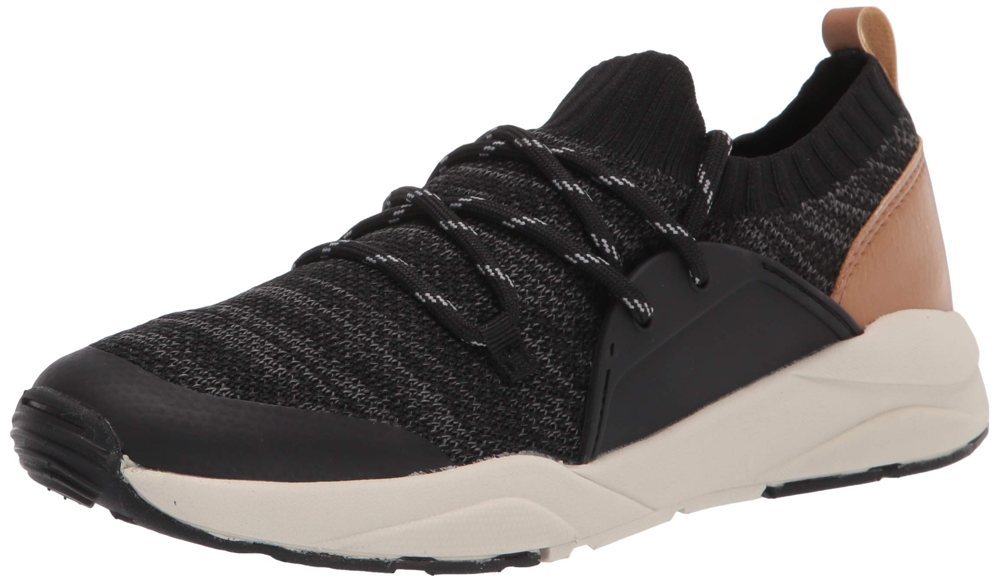

[2023-11-24 23:44:11,784] p3112 {2686887611.py:4} INFO - --------- Match 470 ----------
[2023-11-24 23:44:11,785] p3112 {2686887611.py:5} INFO - Amazon partnered with PUMA to deliver a new comfort-first athleisure collection, matching Amazon’s customer knowledge with PUMA's product expertise. In all of the CARE OF by PUMA footwear we've added a cushioned insole that is flexible and breathable to keep you comfortable throughout your busy lifestyle. Slip into your Comfort Zone in these low-top sneakers and Stay Comfortable on the Go. An Amazon Brand. Designed in Europe - please refer to size chart for specific measurements to achieve the perfect fit
[2023-11-24 23:44:11,786] p3112 {2686887611.py:7} INFO - image file=data/images/en_US/ee5d99bc.jpg


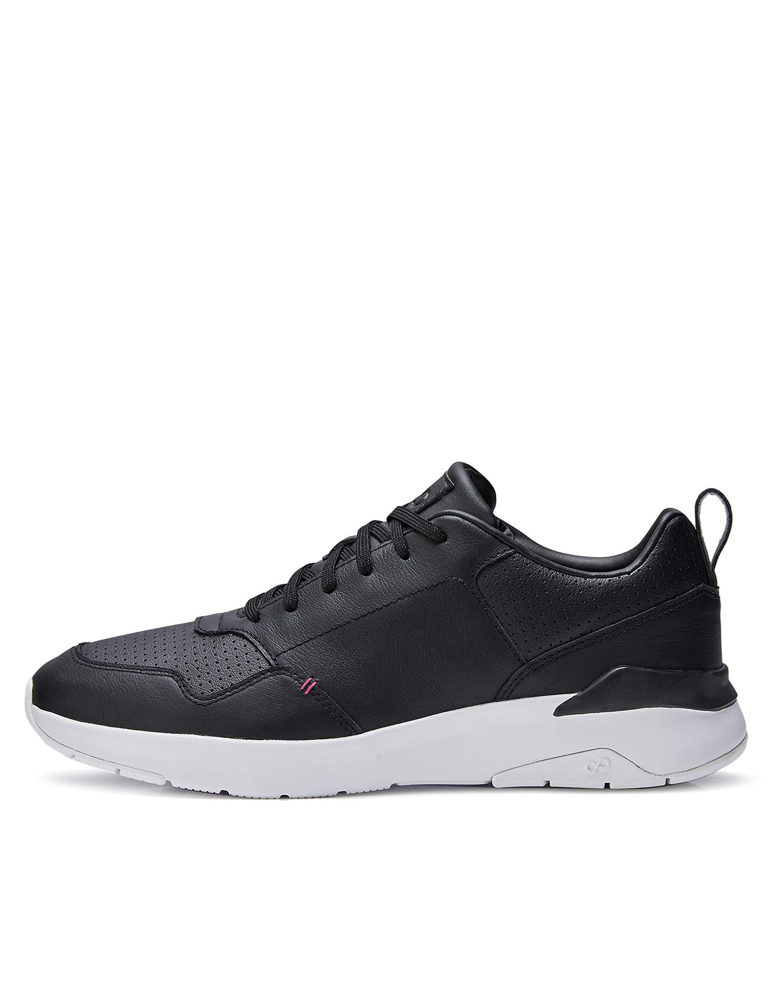

[2023-11-24 23:44:11,941] p3112 {2686887611.py:4} INFO - --------- Match 1073 ----------
[2023-11-24 23:44:11,942] p3112 {2686887611.py:5} INFO - Amazon partnered with PUMA to deliver a new comfort-first athleisure collection, matching Amazon’s customer knowledge with PUMA's product expertise. In all of the CARE OF by PUMA footwear we've added a cushioned insole that is flexible and breathable to keep you comfortable throughout your busy lifestyle. Pair these CARE OF by PUMA Active Sneakers with joggers or chino's and stay comfortable on the go.. An Amazon Brand. Designed in Europe - please refer to size chart for specific measurements to achieve the perfect fit
[2023-11-24 23:44:11,943] p3112 {2686887611.py:7} INFO - image file=data/images/en_US/7e4fa60e.jpg


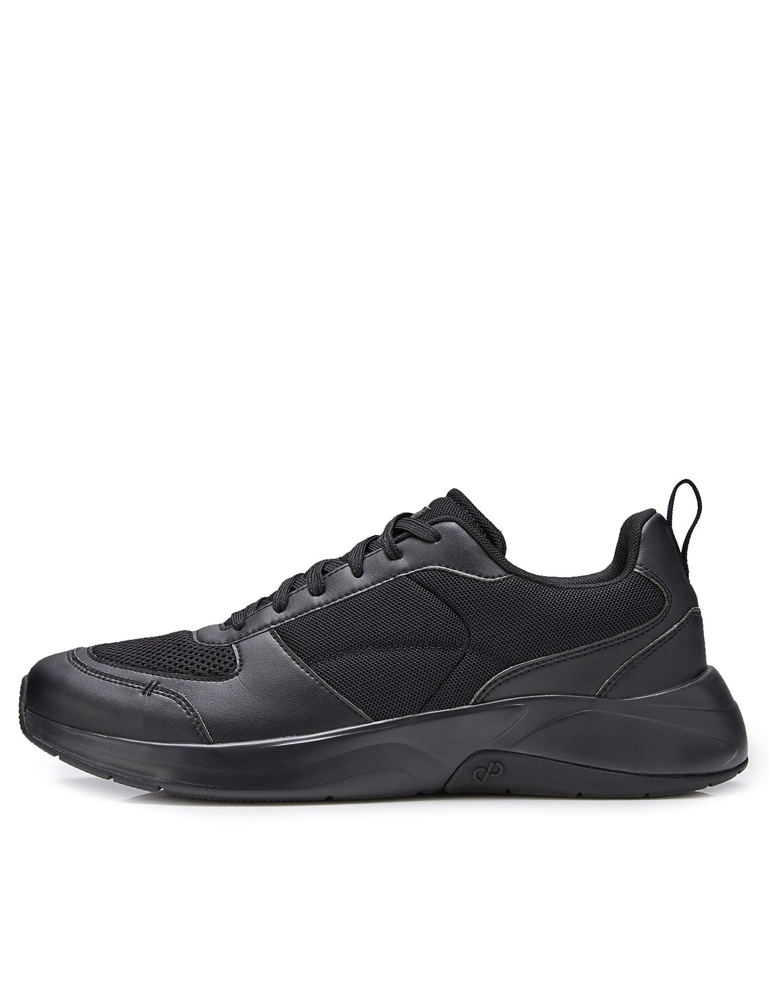

[2023-11-24 23:44:12,136] p3112 {2686887611.py:4} INFO - --------- Match 1072 ----------
[2023-11-24 23:44:12,137] p3112 {2686887611.py:5} INFO - Amazon partnered with PUMA to deliver a new comfort-first athleisure collection, matching Amazon’s customer knowledge with PUMA's product expertise. In all of the CARE OF by PUMA footwear we've added a cushioned insole that is flexible and breathable to keep you comfortable throughout your busy lifestyle. Pair these CARE OF by PUMA Active Sneakers with joggers or chino's and stay comfortable on the go.. An Amazon Brand. Designed in Europe - please refer to size chart for specific measurements to achieve the perfect fit
[2023-11-24 23:44:12,138] p3112 {2686887611.py:7} INFO - image file=data/images/en_US/7e4fa60e.jpg


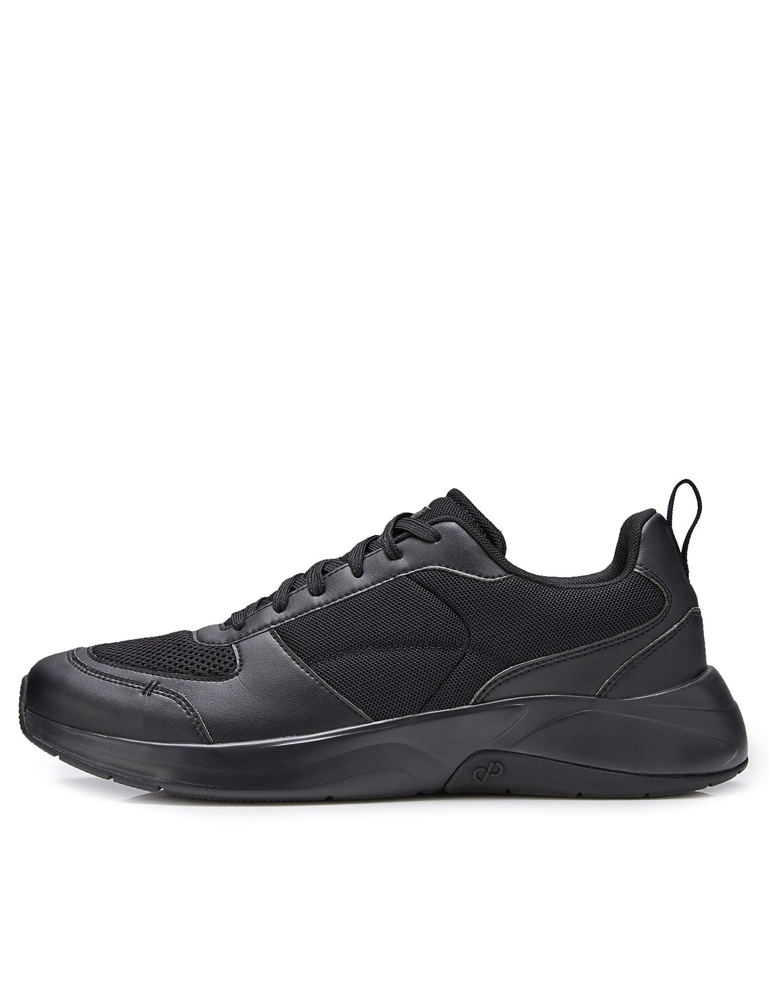

In [19]:
logger.info(f"search text = \"{search_text}\"")

for i, row in matches_from_dataset.iterrows():
    logger.info(f"--------- Match {i} ----------")
    logger.info(row['description'])
    fpath = os.path.join(IMAGES_DIR, os.path.basename(row['path']))
    logger.info(f"image file={fpath}")
    image = display_image(fpath)
    display(image)


In [25]:
inference_modifier = {
    "max_tokens_to_sample": 4096,
    "temperature": 0,
    "top_k": 250,
    "top_p": 1,
    "stop_sequences": ["\n\nHuman"],
}
textgen_llm = Bedrock(
    model_id=CLAUDE_V2_MODEL_ID,
    client=bedrock,
    model_kwargs=inference_modifier,
)


In [26]:
logger.info(f"search text = \"{search_text}\"")
prompt: str = """Human: You are a shopping assistant bot and helping a customer find what they are looking for from an online product catalog. 
The user query and search results from a product catalog are provided below. Some of the search results may not be relevant based on the user query, 
pick the result which exactly match the user's criteria and return their indexes, if you do not find an exact match then return the next most relevant
results but explicitly say that these are most relevant but not exact matches to the user's criteria.

<user_query>
{}
</user_query>

<search_results>
{}
</search_results>

Now based on the information provided above, provide the index of the most relevant results and also say why you choose those results and for the results that
you did not choose say why not. 
Finally, as the last line of your response, write the most relevant indexes as a comma separated list in a line all by itself as:
<relevant_indices></relevant_indices>

Answer:
"""

search_results: str = ""
for i, row in matches_from_dataset.iterrows():
    search_results += f"Index: {i}, Description: {row['description']}\n\n"
prompt = prompt.format(search_text, search_results)
print(prompt)


[2023-11-24 23:45:04,315] p3112 {4197570869.py:1} INFO - search text = "black or gray colored running shoe for men, trail running, comfortable, wide toebox. Only show PUMA or Nike."


Human: You are a shopping assistant bot and helping a customer find what they are looking for from an online product catalog. 
The user query and search results from a product catalog are provided below. Some of the search results may not be relevant based on the user query, 
pick the result which exactly match the user's criteria and return their indexes, if you do not find an exact match then return the next most relevant
results but explicitly say that these are most relevant but not exact matches to the user's criteria.

<user_query>
black or gray colored running shoe for men, trail running, comfortable, wide toebox. Only show PUMA or Nike.
</user_query>

<search_results>
Index: 798, Description: Marking Outsole. Boys sneaker lace- up shoe, easy to slip-on and off. Fashionable, everyday wear in and outdoor. Sports shoe great traction and comfort

Index: 470, Description: Amazon partnered with PUMA to deliver a new comfort-first athleisure collection, matching Amazon’s customer know

In [27]:
response = textgen_llm(prompt)
logger.info(response)


[2023-11-24 23:45:11,693] p3112 {370730027.py:2} INFO -  Based on the user's query, the most relevant search results are:

Index 470 and Index 1073 - These both describe PUMA brand sneakers that are designed for comfort, making them good options for the user who wants comfortable running shoes with a wide toebox. They seem to match the criteria of being running shoes, comfortable, and from the PUMA brand.

Index 798 is not relevant because it is not from PUMA or Nike. 

Index 1072 is not an exact match because while it is a PUMA sneaker, the description does not specify that it is a running shoe or mention a wide toebox.

In summary, the most relevant indexes are:
<relevant_indices>470, 1073</relevant_indices>


In [28]:
index_list_line = response.split("\n")[-1]
logger.info(f"index_list_line={index_list_line}")


[2023-11-24 23:45:11,700] p3112 {2209330169.py:2} INFO - index_list_line=<relevant_indices>470, 1073</relevant_indices>


[2023-11-24 23:45:11,709] p3112 {801937557.py:3} INFO - found=['470, 1073']
[2023-11-24 23:45:11,711] p3112 {801937557.py:8} INFO - --- Best match 470 -----
[2023-11-24 23:45:11,713] p3112 {801937557.py:9} INFO - Description = Amazon partnered with PUMA to deliver a new comfort-first athleisure collection, matching Amazon’s customer knowledge with PUMA's product expertise. In all of the CARE OF by PUMA footwear we've added a cushioned insole that is flexible and breathable to keep you comfortable throughout your busy lifestyle. Slip into your Comfort Zone in these low-top sneakers and Stay Comfortable on the Go. An Amazon Brand. Designed in Europe - please refer to size chart for specific measurements to achieve the perfect fit
[2023-11-24 23:45:11,713] p3112 {801937557.py:11} INFO - image file=data/images/en_US/ee5d99bc.jpg


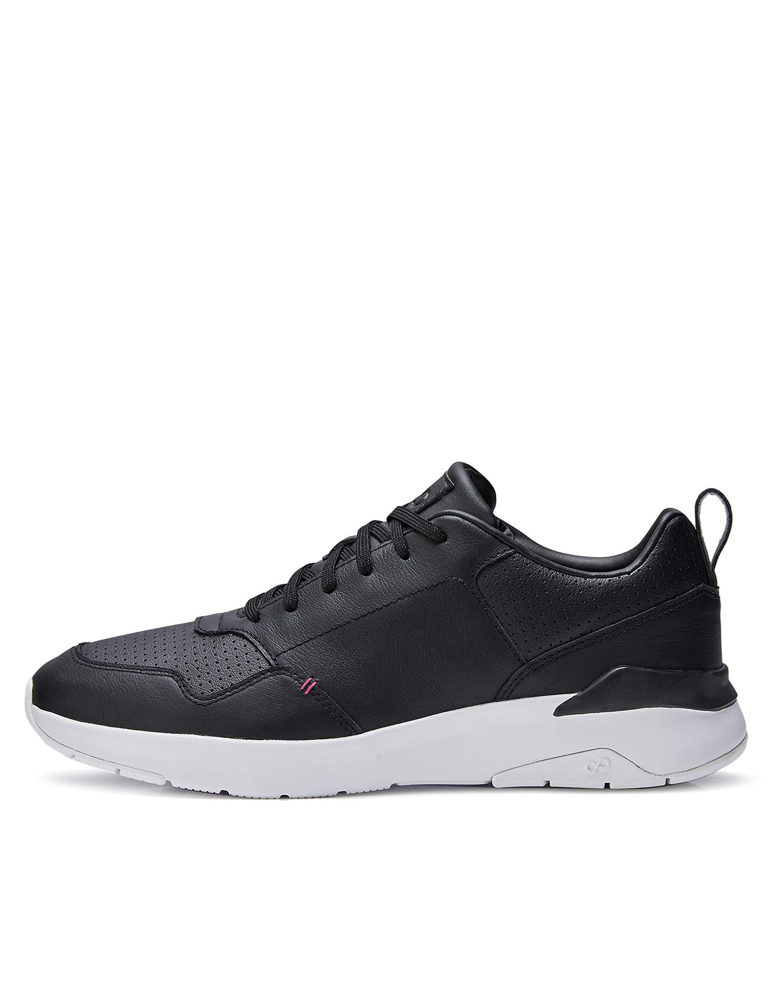

[2023-11-24 23:45:11,904] p3112 {801937557.py:8} INFO - --- Best match 1073 -----
[2023-11-24 23:45:11,905] p3112 {801937557.py:9} INFO - Description = Amazon partnered with PUMA to deliver a new comfort-first athleisure collection, matching Amazon’s customer knowledge with PUMA's product expertise. In all of the CARE OF by PUMA footwear we've added a cushioned insole that is flexible and breathable to keep you comfortable throughout your busy lifestyle. Pair these CARE OF by PUMA Active Sneakers with joggers or chino's and stay comfortable on the go.. An Amazon Brand. Designed in Europe - please refer to size chart for specific measurements to achieve the perfect fit
[2023-11-24 23:45:11,905] p3112 {801937557.py:11} INFO - image file=data/images/en_US/7e4fa60e.jpg


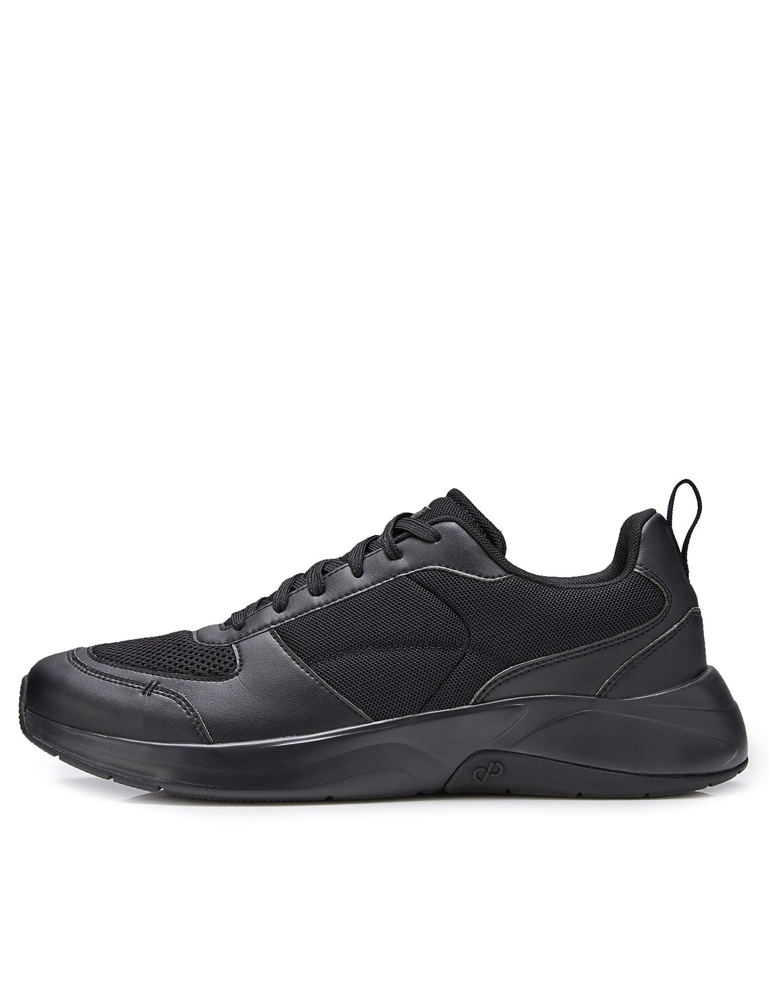

In [29]:
import re
found = re.findall('<relevant_indices>(.*)</relevant_indices>', index_list_line)
logger.info(f"found={found}")
if len(found) > 0:
    indices = [int(i.strip()) for i in found[0].split(",")]
    best_matches = image_dataset_successful_embeddings_only_df.iloc[indices, :]
    for i, row in best_matches.iterrows():
        logger.info(f"--- Best match {i} -----")
        logger.info(f"Description = {row['description']}")
        fpath = os.path.join(IMAGES_DIR, os.path.basename(row['path']))
        logger.info(f"image file={fpath}")
        image = display_image(fpath)
        display(image)
else:
    logger.error(f"the model did not find any valid matches in the multimodal results")
